# Forest Fire Recognition Project - 2nd part

links for datasets used:

    https://www.kaggle.com/phylake1337/fire-dataset
    https://data.mendeley.com/datasets/gjmr63rz2r/1
    https://github.com/LeadingIndiaAI/Forest-Fire-Detection-through-UAV-imagery-using-CNNs
    https://www.kaggle.com/atulyakumar98/test-dataset


# Data, Libraries and Functions

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
pip install tensorflow_addons

     |████████████████████████████████| 1.1 MB 4.1 MB/s 


In [3]:
#Libraries
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
from keras_preprocessing.image import ImageDataGenerator
import tensorflow_addons as tfa
import datetime, os
from sklearn.metrics import confusion_matrix, f1_score, classification_report, ConfusionMatrixDisplay
%load_ext tensorboard

In [4]:
!unzip drive/MyDrive/ForestFireDataset.zip

Archive:  drive/MyDrive/ForestFireDataset.zip
   creating: ForestFireDataset/
   creating: ForestFireDataset/fire_images/
  inflating: ForestFireDataset/fire_images/1.jpg  
  inflating: ForestFireDataset/fire_images/10.jpg  
  inflating: ForestFireDataset/fire_images/100.jpg  
  inflating: ForestFireDataset/fire_images/101.jpg  
  inflating: ForestFireDataset/fire_images/102.jpg  
  inflating: ForestFireDataset/fire_images/103.jpg  
  inflating: ForestFireDataset/fire_images/104.jpg  
  inflating: ForestFireDataset/fire_images/105.png  
  inflating: ForestFireDataset/fire_images/106.jpg  
  inflating: ForestFireDataset/fire_images/107.jpg  
  inflating: ForestFireDataset/fire_images/108.jpg  
  inflating: ForestFireDataset/fire_images/109.jpg  
  inflating: ForestFireDataset/fire_images/11.jpg  
  inflating: ForestFireDataset/fire_images/110.jpg  
  inflating: ForestFireDataset/fire_images/12.jpg  
  inflating: ForestFireDataset/fire_images/13.jpg  
  inflating: ForestFireDataset/fire_

In [5]:
H,W = 224,224
BATCH_SIZE = 64

In [6]:
dataset = tf.keras.preprocessing.image_dataset_from_directory('./ForestFireDataset', shuffle=True, seed=42, image_size=(H, W),batch_size=1)
ds=dataset.unbatch()

Found 4872 files belonging to 2 classes.


In [7]:
DATASET_SIZE=4872

In [8]:
train_size = int(0.8 * DATASET_SIZE)
val_size = int(0.1 * DATASET_SIZE)
test_size = int(0.1 * DATASET_SIZE)


train_dataset = ds.take(train_size)
test_dataset = ds.skip(train_size)
val_dataset = test_dataset.skip(test_size)
test_dataset = test_dataset.take(test_size)

In [9]:
train_dataset = train_dataset.batch(BATCH_SIZE)
val_dataset   = val_dataset.batch(BATCH_SIZE)
test_dataset  = test_dataset.batch(BATCH_SIZE)

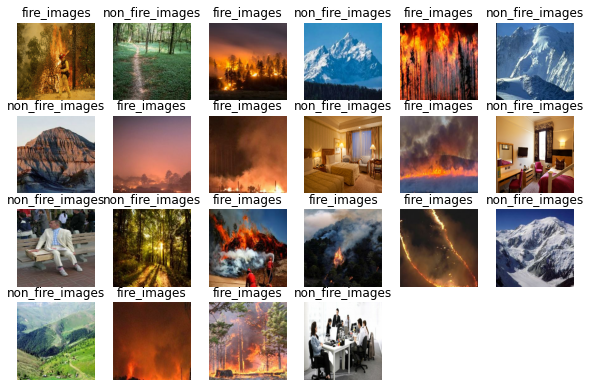

In [10]:
#Visualizing the data
plt.figure(figsize=(10, 10))
class_names = dataset.class_names
for images, labels in train_dataset.take(1):
    for i in range(BATCH_SIZE):
        ax = plt.subplot(6, 6, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")
        if i>20:
          break

### Functions

Here we have some functions to visualize metrics and evaluate the performances of our models.

In [11]:
#Print loss and accuracy wrt epochs
def plot_res(history):
  %matplotlib inline
  import matplotlib.pyplot as plt
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  epochs = range(len(acc))

  plt.plot(epochs, acc, 'g', label='Training accuracy')
  plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
  plt.title('Training and validation accuracy')

  plt.legend(loc=0)
  plt.figure()
  plt.show()

  plt.plot(epochs, loss, 'r', label='Training loss')
  plt.plot(epochs, val_loss, 'orange', label='Validation loss')
  plt.title('Training and validation loss')

  plt.legend(loc=0)
  plt.figure()
  plt.show()

In [12]:
def misclass(model,dataset):
  """
  Function returning the misclassified samples 


  TP: fires,     FP: not fires but fires
  TN: non fires, FN: fire but not fires
  """

  misclass=[]
  nofire_butfire=[]
  fire_butnotfire=[]
  predictions = []
  num_s=0
  TP=0
  for batch,labels in dataset:
    pred = model.predict(batch)
    for i in range(0,len(batch)):
      if num_s>489:
        break
      y_pred=pred[i]
      y_true=labels[i]
      if int(y_true) != tf.round(y_pred[0]):
        misclass.append([batch[i],y_true,y_pred])
        if int(y_true) == 1:
          nofire_butfire.append([batch[i][0],y_true,y_pred])
        else:
          fire_butnotfire.append([batch[i][0],y_true,y_pred])
      elif int(y_true) ==0: #y_true 0 and y_pred = 0 
        TP+=1
      
      num_s+=1
    
  return misclass

In [13]:
def report(model,ds):
  predictions=[]
  true_values=[]
  num_b=0
  num_s=0
  for batch,labels in ds:
    batch_pred = model.predict(batch)
    
    for i in range(0,len(batch)):
      if num_s>489:
        break
      predictions.append(tf.round(batch_pred[i]))
      true_values.append(tf.round(labels[i]))
      num_s+=1

  print("\nReport:")
  print("\nF1_score:")
  print(f1_score(true_values,predictions))
  target_names = ['fire','not fire']
  print(classification_report(true_values,predictions,target_names=target_names))
  print("\nConfusion Matrix:")
  cm=confusion_matrix(true_values,predictions)
  disp = ConfusionMatrixDisplay(confusion_matrix=cm)
  disp.plot()

In [14]:
def visualize_errors(misclass):
  """
  Visualize the misclassified samples

  """
  i=0
  plt.figure(figsize=(50, 50))
  for x,y,z in misclass:
    ax = plt.subplot(len(misclass),1, i+1)
    plt.imshow(x.numpy().astype("uint8"))
    plt.title('True label '+str(int(y)) + ' but predicted ' + str(z[0]))
    plt.axis("off")
    i+=1
    #plt.show()

# Baselines

### Start

In [15]:
mb = tf.keras.applications.MobileNetV2(input_shape=(H, W, 3), include_top=False, weights='imagenet')
en = tf.keras.applications.EfficientNetB0(input_shape=(H, W, 3), include_top=False, weights='imagenet')
vg = tf.keras.applications.VGG16(input_shape=(H, W, 3), include_top=False, weights='imagenet')

58900480/58889256 [==============================] - 1s 0us/step


In [16]:
def build_model(net,augment=False,da_layer=None,dropout=.2):

  input_tensor = tf.keras.layers.Input(shape=(H, W, 3))

  if augment==True:
    x = da_layer(input_tensor)
  else:
    x = input_tensor

  if net.name[0] == 'm':
    preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input
    x=preprocess_input(x)
  elif net.name[0] == 'v':
    preprocess_input = tf.keras.applications.vgg16.preprocess_input
    x=preprocess_input(x)
  
  base_model = net
  base_model.trainable = False #freezing the backbone

  x = base_model(x, training=False)
  x = tf.keras.layers.GlobalAveragePooling2D()(x)
  x = tf.keras.layers.Dropout(dropout)(x)
  predictions = tf.keras.layers.Dense(1, activation='sigmoid')(x)

  model = tf.keras.Model(inputs=input_tensor, outputs=predictions)

  return model


### VGG16

In [45]:
opt = tf.keras.optimizers.SGD(learning_rate=5e-4,momentum=.9)

In [46]:
vg_model = build_model(net=vg,dropout=.2)

In [47]:
vg_model.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 tf.__operators__.getitem_3   (None, 224, 224, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_3 (TFOpLambd  (None, 224, 224, 3)      0         
 a)                                                              
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d_3   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                           

In [48]:
vg_model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])

In [49]:
es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)

In [50]:
vg_history = vg_model.fit(train_dataset,validation_data=val_dataset,epochs=50, callbacks=[es_callback])

Epoch 1/50
61/61 [==============================] - 56s 897ms/step - loss: 0.4129 - accuracy: 0.8712 - val_loss: 0.1140 - val_accuracy: 0.9570
Epoch 2/50
61/61 [==============================] - 55s 900ms/step - loss: 0.1899 - accuracy: 0.9374 - val_loss: 0.0955 - val_accuracy: 0.9652
Epoch 3/50
61/61 [==============================] - 55s 899ms/step - loss: 0.1666 - accuracy: 0.9502 - val_loss: 0.0904 - val_accuracy: 0.9693
Epoch 4/50
61/61 [==============================] - 55s 900ms/step - loss: 0.1430 - accuracy: 0.9536 - val_loss: 0.0822 - val_accuracy: 0.9713
Epoch 5/50
61/61 [==============================] - 55s 896ms/step - loss: 0.1318 - accuracy: 0.9541 - val_loss: 0.0782 - val_accuracy: 0.9713
Epoch 6/50
61/61 [==============================] - 55s 900ms/step - loss: 0.1347 - accuracy: 0.9589 - val_loss: 0.0769 - val_accuracy: 0.9734
Epoch 7/50
61/61 [==============================] - 55s 901ms/step - loss: 0.1243 - accuracy: 0.9597 - val_loss: 0.0756 - val_accuracy: 0.9754

In [51]:
# %% Evaluate Model
vg_model.evaluate(test_dataset)

8/8 [==============================] - 22s 542ms/step - loss: 0.0928 - accuracy: 0.9692


[0.09281180799007416, 0.9691991806030273]

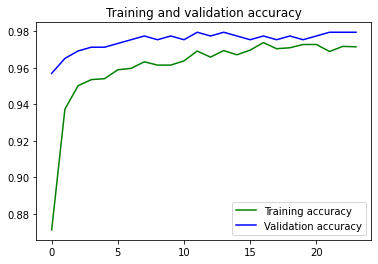

<Figure size 432x288 with 0 Axes>

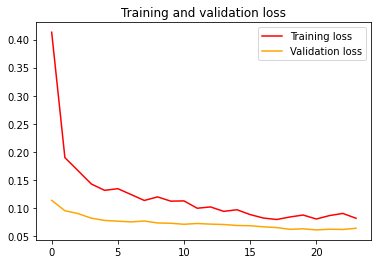

<Figure size 432x288 with 0 Axes>

In [52]:
plot_res(history=vg_history)

In [53]:
vg_err=misclass(vg_model,test_dataset)

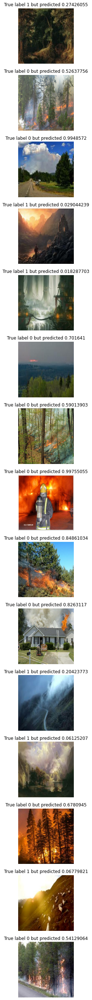

In [54]:
x=visualize_errors(vg_err)


Report:

F1_score:
0.9741824440619621
              precision    recall  f1-score   support

        fire       0.97      0.95      0.96       198
    not fire       0.97      0.98      0.97       289

    accuracy                           0.97       487
   macro avg       0.97      0.97      0.97       487
weighted avg       0.97      0.97      0.97       487


Confusion Matrix:


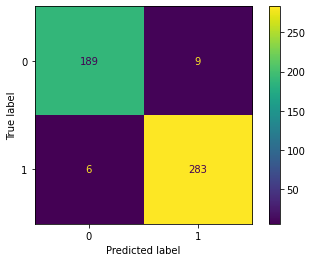

In [55]:
report(vg_model,test_dataset)

### MobileNetV2

In [56]:
opt = tf.keras.optimizers.Adam(learning_rate=1e-3)

In [57]:
mb_model = build_model(net=mb)

In [58]:
mb_model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])

In [59]:
mb_history = mb_model.fit(train_dataset,validation_data=val_dataset,epochs=50, callbacks=[es_callback])

Epoch 1/50
61/61 [==============================] - 49s 739ms/step - loss: 0.2993 - accuracy: 0.8776 - val_loss: 0.1410 - val_accuracy: 0.9508
Epoch 2/50
61/61 [==============================] - 42s 693ms/step - loss: 0.1296 - accuracy: 0.9579 - val_loss: 0.1042 - val_accuracy: 0.9570
Epoch 3/50
61/61 [==============================] - 42s 696ms/step - loss: 0.1028 - accuracy: 0.9651 - val_loss: 0.0907 - val_accuracy: 0.9590
Epoch 4/50
61/61 [==============================] - 42s 688ms/step - loss: 0.0901 - accuracy: 0.9707 - val_loss: 0.0831 - val_accuracy: 0.9631
Epoch 5/50
61/61 [==============================] - 42s 693ms/step - loss: 0.0815 - accuracy: 0.9710 - val_loss: 0.0781 - val_accuracy: 0.9693
Epoch 6/50
61/61 [==============================] - 42s 695ms/step - loss: 0.0779 - accuracy: 0.9754 - val_loss: 0.0745 - val_accuracy: 0.9693
Epoch 7/50
61/61 [==============================] - 42s 687ms/step - loss: 0.0714 - accuracy: 0.9769 - val_loss: 0.0715 - val_accuracy: 0.9693

In [60]:
# %% Evaluate Model
mb_model.evaluate(test_dataset)

8/8 [==============================] - 20s 356ms/step - loss: 0.0800 - accuracy: 0.9713


[0.08001109212636948, 0.9712525606155396]

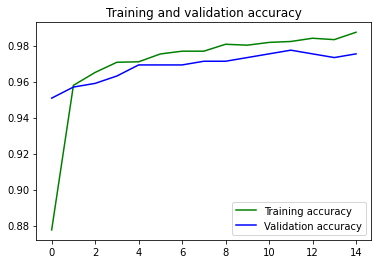

<Figure size 432x288 with 0 Axes>

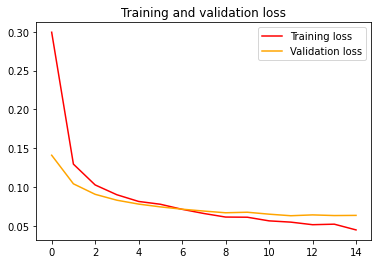

<Figure size 432x288 with 0 Axes>

In [62]:
plot_res(history=mb_history)


Report:

F1_score:
0.9761904761904763
              precision    recall  f1-score   support

        fire       0.98      0.95      0.96       196
    not fire       0.97      0.99      0.98       291

    accuracy                           0.97       487
   macro avg       0.97      0.97      0.97       487
weighted avg       0.97      0.97      0.97       487


Confusion Matrix:


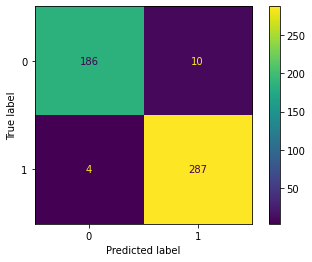

In [63]:
report(mb_model,test_dataset)

### EfficientNetB0

In [29]:
en_model = build_model(net=en,dropout=.1)

In [30]:
opt = tf.keras.optimizers.Adam(learning_rate=1e-3)

In [31]:
en_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetb0 (Functional)  (None, 7, 7, 1280)       4049571   
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 1280)              0         
                                                                 
 dense (Dense)               (None, 1)                 1281      
                                                                 
Total params: 4,050,852
Trainable params: 1,281
Non-trainable params: 4,049,571
_______________________________________________

In [32]:
en_model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])

In [33]:
es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)

In [34]:
en_history = en_model.fit(train_dataset,validation_data=val_dataset,epochs=75, callbacks=[es_callback])

Epoch 1/75
61/61 [==============================] - 63s 784ms/step - loss: 0.3382 - accuracy: 0.9027 - val_loss: 0.1643 - val_accuracy: 0.9631
Epoch 2/75
61/61 [==============================] - 44s 726ms/step - loss: 0.1532 - accuracy: 0.9623 - val_loss: 0.1111 - val_accuracy: 0.9693
Epoch 3/75
61/61 [==============================] - 44s 719ms/step - loss: 0.1173 - accuracy: 0.9710 - val_loss: 0.0919 - val_accuracy: 0.9693
Epoch 4/75
61/61 [==============================] - 44s 719ms/step - loss: 0.0994 - accuracy: 0.9718 - val_loss: 0.0785 - val_accuracy: 0.9775
Epoch 5/75
61/61 [==============================] - 45s 729ms/step - loss: 0.0885 - accuracy: 0.9761 - val_loss: 0.0719 - val_accuracy: 0.9775
Epoch 6/75
61/61 [==============================] - 44s 724ms/step - loss: 0.0801 - accuracy: 0.9779 - val_loss: 0.0689 - val_accuracy: 0.9775
Epoch 7/75
61/61 [==============================] - 44s 719ms/step - loss: 0.0743 - accuracy: 0.9787 - val_loss: 0.0632 - val_accuracy: 0.9816

In [35]:
en_model.evaluate(test_dataset)

8/8 [==============================] - 20s 418ms/step - loss: 0.0434 - accuracy: 0.9877


[0.043411482125520706, 0.987679660320282]

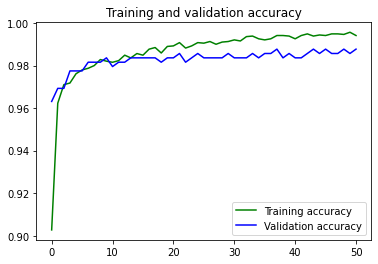

<Figure size 432x288 with 0 Axes>

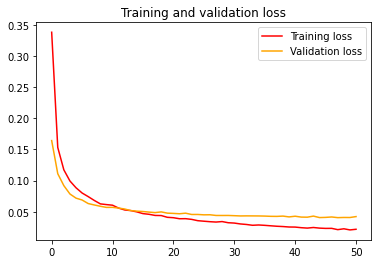

<Figure size 432x288 with 0 Axes>

In [36]:
plot_res(en_history)

In [37]:
en_err=misclass(en_model,test_dataset)

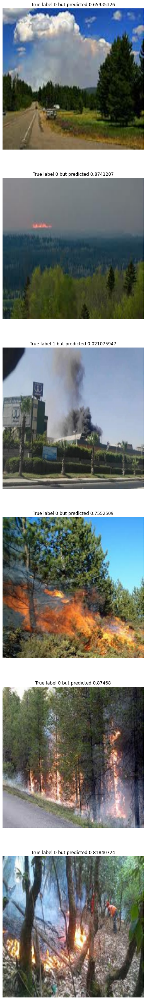

In [38]:
x=visualize_errors(en_err)


Report:

F1_score:
0.9896551724137932
              precision    recall  f1-score   support

        fire       0.99      0.97      0.98       199
    not fire       0.98      1.00      0.99       288

    accuracy                           0.99       487
   macro avg       0.99      0.99      0.99       487
weighted avg       0.99      0.99      0.99       487


Confusion Matrix:


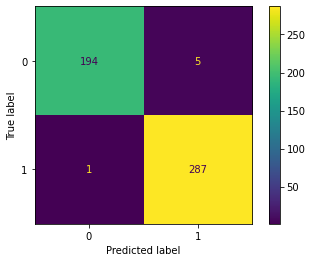

In [40]:
report(en_model,test_dataset)

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[253.      , 247.      , 251.      ],
        [252.67857 , 246.67857 , 250.67857 ],
        [252.      , 246.      , 250.      ],
        ...,
        [249.      , 248.      , 217.      ],
        [249.      , 248.      , 217.67859 ],
        [249.      , 248.      , 218.      ]],

       [[253.      , 247.      , 251.      ],
        [252.67857 , 246.67857 , 250.67857 ],
        [252.      , 246.      , 250.      ],
        ...,
        [249.      , 248.      , 217.      ],
        [249.50137 , 248.50137 , 218.17996 ],
        [249.73885 , 248.73885 , 218.73885 ]],

       [[253.      , 247.      , 251.      ],
        [252.67857 , 246.67857 , 250.67857 ],
        [252.      , 246.      , 250.      ],
        ...,
        [249.56473 , 248.56473 , 218.12947 ],
        [249.8601  , 248.8601  , 219.48665 ],
        [250.      , 249.      , 220.12947 ]],

       ...,

       [[ 14.153779,  14.153779,  16.15378 ],
        [ 16.

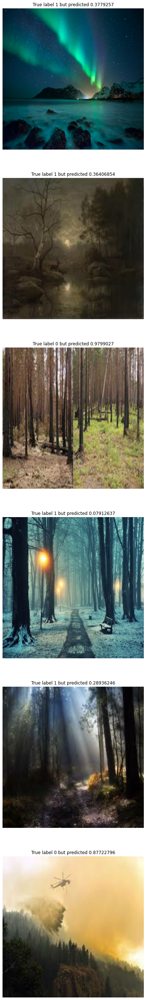

In [59]:
visualize_errors(misclass(en_model,val_dataset))

# Data Augmentation


In [85]:
#CROP_SIZE=180
augmentation_layer = tf.keras.Sequential([ 
    tf.keras.layers.RandomFlip('horizontal'),
    #tf.keras.layers.RandomRotation(0.1),
    #tf.keras.layers.RandomCrop(height=CROP_SIZE,width=CROP_SIZE),
    #tf.keras.layers.Resizing(H,W)

])

In [86]:
en_da_model = build_model(en,dropout=0.1, augment=True, da_layer = augmentation_layer)

In [87]:
en_da_model.summary()

Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 sequential_2 (Sequential)   (None, 224, 224, 3)       0         
                                                                 
 efficientnetb0 (Functional)  (None, 7, 7, 1280)       4049571   
                                                                 
 global_average_pooling2d_7   (None, 1280)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_7 (Dropout)         (None, 1280)              0         
                                                                 
 dense_7 (Dense)             (None, 1)                 1281      
                                                           

In [88]:
en_da_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3), 
                    loss='binary_crossentropy', 
                    metrics=['accuracy'])

In [89]:
es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)

In [ ]:
en_da_history = en_da_model.fit(train_dataset,validation_data=val_dataset,epochs=75, callbacks=[es_callback])

Epoch 1/75
61/61 [==============================] - 51s 729ms/step - loss: 0.3736 - accuracy: 0.8779 - val_loss: 0.1726 - val_accuracy: 0.9672
Epoch 2/75
61/61 [==============================] - 43s 709ms/step - loss: 0.1621 - accuracy: 0.9600 - val_loss: 0.1125 - val_accuracy: 0.9693
Epoch 3/75
61/61 [==============================] - 44s 712ms/step - loss: 0.1239 - accuracy: 0.9656 - val_loss: 0.0932 - val_accuracy: 0.9713
Epoch 4/75
61/61 [==============================] - 43s 706ms/step - loss: 0.1044 - accuracy: 0.9702 - val_loss: 0.0791 - val_accuracy: 0.9816
Epoch 5/75
61/61 [==============================] - 43s 704ms/step - loss: 0.0927 - accuracy: 0.9723 - val_loss: 0.0723 - val_accuracy: 0.9816
Epoch 6/75
61/61 [==============================] - 43s 702ms/step - loss: 0.0825 - accuracy: 0.9772 - val_loss: 0.0669 - val_accuracy: 0.9816
Epoch 7/75
61/61 [==============================] - 43s 708ms/step - loss: 0.0769 - accuracy: 0.9774 - val_loss: 0.0635 - val_accuracy: 0.9816

In [ ]:
plot_res(en_da_history)

In [ ]:
err_da_en=misclass(en_da_model,test_dataset)

In [ ]:
x=visualize_errors(err_da_en)

In [ ]:
report(en_da_model,test_dataset)

# Error Analysis

Unfortunetly i had to copy the source code of EBAnO express since i had to modify a function. By importing the code from github this was not possible. 

EBAnO Express :

https://github.com/EBAnO-Ecosystem/EBAnO-Express


https://arxiv.org/pdf/1908.04348.pdf

Let's see how the second approach behaves wrt sunsets.

In [15]:
#Libraries
import cv2
import PIL

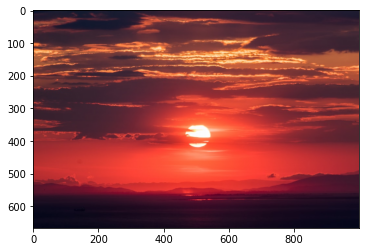

In [235]:
#let'see if the model fails in general with sunsets

img = cv2.imread("/content/drive/MyDrive/sunset.jpg")
img_cvt=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_cvt)
plt.show()

In [236]:
res = cv2.resize(img_cvt, (H,W), interpolation=cv2.INTER_LINEAR)

In [237]:
res.shape

(224, 224, 3)

In [238]:
res = np.expand_dims(res, axis=0)

In [239]:
en_model.predict(res)[0]  

array([0.9419363], dtype=float32)

In [240]:
VGG16_model = tf.keras.applications.VGG16(include_top=True, weights='imagenet', classes=1000)
target_size = VGG16_model._feed_input_shapes[0][1:3]
print("target_size:", target_size)
VGG16_model

target_size: (224, 224)


### Functions

In [16]:
def load_image(image_url, target_size):
    img = image.load_img(image_url, target_size=target_size)
    return img

def preprocess_function(img, model_preproc):
    x = image.img_to_array(img)
    x = np.expand_dims(x.astype("uint8"), axis=0)
    return model_preproc(x)

def find(model,coi,top_preds,fires):
  """
  This function returns a list of images which have 
  the desired class of interest("coi") in their top "top_preds"
  predictions obtained with the classifier ("model").

  """
  res=[]
  for el,_ in fires:
    el = np.expand_dims(el.astype("uint8"), axis=0)
    x = preprocess_function(el[0], tf.keras.applications.vgg16.preprocess_input)
    predictions=model.predict(x) #prediction
    preds_indexes = np.argsort(predictions[0])[::-1][:top_preds] #top predictions

    if coi in preds_indexes:
      res.append(el)
  print('Number of images found:',len(res))
  
  return res


def visualize_correlation(coi,L):
  """
  Function to visualize feature maps from the list of images
  related to the coi. In particular, EBAnO segments the image 
  and is able to show how the segmented region is related to 
  the coi. 
  Stronger the green color, stronger the relation to the class.
  """

  for el in L:
    plt.imshow(el[0].astype("uint8")) #visualizing the orginal image
    i = cv2.resize(el[0], (224,224), interpolation=cv2.INTER_LINEAR)

    #EBAnO application to visualize feature maps 
    ebano_el=LocalExplanationModel(i, coi,
                                  VGG16_model,
                                  preprocess_func=lambda x: preprocess_function(x, tf.keras.applications.vgg16.preprocess_input),
                                  max_features=5,
                                  layers_to_analyze=10)
    
    ebano_el.fit_explanation(verbose=True)

    ebano_el.best_explanation.show_features_map()
    plt.show()
    plt.close()

    ebano_el.best_explanation.show_visual_explanation()
    plt.show()
    plt.close

###  EBAnO

In [17]:
from collections import OrderedDict

import numpy as np
from matplotlib.patches import Rectangle
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import normalize

from tensorflow.python import keras
from tensorflow.python.keras import backend as K
from PIL import Image, ImageFilter

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import seaborn as sns
import sys

import pandas as pd


class PerturbationScores:

    col_prediction = "prediction"
    col_prediction_t = "prediction_t"
    col_a_PIR = "a_PIR"
    col_b_PIR = "b_PIR"
    col_PIR = "PIR"
    col_nPIR = "nPIR"
    col_a_PIRP = "a_PIRP"
    col_b_PIRP = "b_PIRP"
    col_PIRP = "PIRP"
    col_nPIRP  = "nPIRP"

    def __init__(self, P_o, P_t, coi):

        self.coi = coi

        self.P_o = P_o
        self.p_o = self.P_o[self.coi]

        if P_t is not None:
            self.P_t = P_t
            self.p_t = self.P_t[self.coi]
        else:
            self.P_t = None
            self.p_t = float('NaN')

        self.PIR = float('NaN')
        self.PIRP = float('NaN')

        self.nPIR = float('NaN')
        self.nPIRP = float('NaN')

        self.a_pir, self.b_pir = float('NaN'), float('NaN')
        self.classes_npir = float('NaN')
        self.w_c_npir = float('NaN')
        self.pirp_coi = float('NaN')
        self.pirp_no_coi = float('NaN')
        self.a_pirp, self.b_pirp = float('NaN'), float('NaN')

    @staticmethod
    def softsign_norm(x):
        x_n = x / (1 + abs(x))
        return x_n

    @staticmethod
    def relu(x):
        if x >= 0:
            return x
        else:
            return 0.0

    @staticmethod
    def _get_a_b(p_o, p_t):

        a = (1 - p_o / p_t)

        if a == float('inf'):
            a = sys.float_info.max
        elif a == float('-inf'):
            a = -sys.float_info.max

        b = (1 - p_t / p_o)

        if b == float('inf'):
            b = sys.float_info.max
        elif b == float('-inf'):
            b = -sys.float_info.max

        return a, b

    @staticmethod
    def compute_influence_relation(p_o, p_t):
        a, b = PerturbationScores._get_a_b(p_o, p_t)
        return (p_t * b) - (p_o * a)

    @staticmethod
    def compute_perturbation_influence_relation(p_o, p_t):
        return PerturbationScores.compute_influence_relation(p_o, p_t)

    @staticmethod
    def compute_perturbation_influence_relation_normalized(p_o, p_t):
        PIR = PerturbationScores.compute_perturbation_influence_relation(p_o, p_t)
        return PerturbationScores.softsign_norm(PIR)

    @staticmethod
    def compute_npir_for_all_classes(P_o, P_t):
        classes_npir = [PerturbationScores.compute_perturbation_influence_relation_normalized(p_o, p_t) for p_o, p_t in zip(P_o, P_t)]
        return classes_npir

    @staticmethod
    def weighted_classes_npir(classes_npir, weights):
        return classes_npir * weights

    @staticmethod
    def pirp_coi(w_c_npir, coi):
        pirp_coi = abs(w_c_npir[coi])
        return pirp_coi

    @staticmethod
    def pirp_no_coi(w_c_npir, coi):
        w_c_npir_no_coi = w_c_npir.copy()
        w_c_npir_no_coi[coi] = 0.0
        w_c_npir_no_coi = [PerturbationScores.relu(wir) for wir in w_c_npir_no_coi]
        pirp_no_coi = sum(w_c_npir_no_coi)
        return pirp_no_coi

    @staticmethod
    def compute_perturbation_influence_relation_precision(P_o, P_t, coi):
        classes_npir = PerturbationScores.compute_npir_for_all_classes(P_o, P_t)

        w_c_npir = PerturbationScores.weighted_classes_npir(classes_npir, P_o)

        pirp_coi = PerturbationScores.pirp_coi(w_c_npir, coi)
        pirp_no_coi = PerturbationScores.pirp_no_coi(w_c_npir, coi)

        return PerturbationScores.compute_influence_relation(pirp_coi, pirp_no_coi)

    @staticmethod
    def compute_perturbation_influence_relation_precision_normalized(P_o, P_t, coi):
        """
        se new_irp_simm > 0 -> la feature è precisa nella la classe in esame \n
        se new_irp_simm = 0 -> la feature non è precisa nella la classe in esame ma impatta anche altre classi \n
        se new_irp_simm < 0 -> la feature non è precisa nella la classe in esame e impatta maggiormente altre classi \n\n

        :param P_o:
        :param P_t:
        :param coi:
        :return:
        """
        pirp = PerturbationScores.compute_perturbation_influence_relation_precision(P_o, P_t, coi)
        return PerturbationScores.softsign_norm(pirp)

    def compute_scores(self):

        if self.P_t is None:
            return self

        self.PIR = PerturbationScores.compute_perturbation_influence_relation(self.p_o, self.p_t)
        self.nPIR = PerturbationScores.compute_perturbation_influence_relation_normalized(self.p_o, self.p_t)

        self.PIRP = PerturbationScores.compute_perturbation_influence_relation_precision(self.P_o, self.P_t, self.coi)
        self.nPIRP = PerturbationScores.compute_perturbation_influence_relation_precision_normalized(self.P_o, self.P_t, self.coi)

        self.a_pir, self.b_pir = PerturbationScores._get_a_b(self.p_o, self.p_t)

        self.classes_npir = PerturbationScores.compute_npir_for_all_classes(self.P_o, self.P_t)

        self.w_c_npir = PerturbationScores.weighted_classes_npir(self.classes_npir, self.P_o)

        self.pirp_coi = PerturbationScores.pirp_coi(self.w_c_npir, self.coi)
        self.pirp_no_coi = PerturbationScores.pirp_no_coi(self.w_c_npir, self.coi)

        self.a_pirp, self.b_pirp = PerturbationScores._get_a_b(self.pirp_coi, self.pirp_no_coi)

        return self

    def get_scores_dict(self):
        scores_dict = OrderedDict()

        scores_dict[self.col_prediction] = float(self.p_o)
        scores_dict[self.col_prediction_t] = float(self.p_t)

        # PIR - Perturbation Influence Relation
        scores_dict[self.col_a_PIR] = float(self.a_pir)
        scores_dict[self.col_b_PIR] = float(self.b_pir)
        scores_dict[self.col_PIR] = float(self.PIR)
        scores_dict[self.col_nPIR] = float(self.nPIR)

        # PIRP - Perturbation Influence Relation Precision
        scores_dict[self.col_a_PIRP] = float(self.a_pirp)
        scores_dict[self.col_b_PIRP] = float(self.b_pirp)
        scores_dict[self.col_PIRP] = float(self.PIRP)
        scores_dict[self.col_nPIRP] = float(self.nPIRP)

        return scores_dict

    def __str__(self):
        return str(self.get_scores_dict())


class LocalExplanation:

    def __init__(self, input_image, class_of_interest, features_map, model, preprocess_func):
        self.input_image = input_image
        self.class_of_interest = class_of_interest
        self.features_map = features_map
        self.model=model
        self.preprocess_func = preprocess_func
        self.cmap = sns.diverging_palette(20, 130, l=60, as_cmap=True)  # 20 -> red, 130 -> green

        self.original_predictions = self.predict_with_model(input_image)
        self.feature_ids = np.unique(self.features_map)

        self.perturbations = {}
        self.numerical_explanation = {}
        self.visual_explanation = None

        self.informativeness = None

    def predict_with_model(self, img):
        if self.preprocess_func:
            input_image_arr = self.preprocess_func(img)
        else:
            raise Exception("Preprocessing function not provided. You should always provide the same preprocess function used on the input image.")

        p = self.model.predict(input_image_arr)
        return p[0]

    @staticmethod
    def _find_centroid(init_x, X, n_iter=10):
        new_x = init_x
        f_X = X

        for i in range(n_iter):
            dist = np.linalg.norm(f_X - new_x, axis=1)
            if f_X[dist < np.mean(dist)].__len__() > 0:
                f_X = f_X[dist < np.mean(dist)]
            else:
                break

            new_x = np.percentile(f_X, 50, interpolation="nearest", axis=0).astype(np.int64)
        return new_x

    @staticmethod
    def _color_palette():
        return (np.array(sns.color_palette("Set3")) * 255).astype(np.uint8)

    @staticmethod
    def _color_rgba(i, alpha=255):
        r, g, b = LocalExplanation._color_palette()[i, :]
        return (r, g, b, alpha)

    def show_features_map(self):

        colored_feature_map = np.zeros((self.features_map.shape[0], self.features_map.shape[0], 4), np.int64)
        coordinates = []

        for f_idx in self.feature_ids:
            feature_map_mask = np.zeros((self.features_map.shape[0], self.features_map.shape[0], 4), np.int64) # init empty mask
            c = self._color_rgba(f_idx - 1) # color

            f = self._get_feature_mask(f_idx)

            x_coors, y_coors = np.where(f == 255)
            y_coor, x_coor = np.percentile(x_coors, 50).astype(int), np.percentile(y_coors, 50).astype(int)

            coors = np.array([x_coors, y_coors]).transpose(1, 0)
            coor = np.array([(x_coor, y_coor)])

            coor = self._find_centroid(coor, coors)
            y_coor, x_coor = coor[0], coor[1]

            # set_color
            feature_map_mask[x_coors, y_coors] = c

            colored_feature_map += feature_map_mask

            coordinates.append((f_idx, x_coor, y_coor, c))

        fig, ax = plt.subplots(figsize=(5, 5), dpi=90)
        fig.tight_layout()
        ax.imshow(colored_feature_map)

        for fid, x_coor, y_coor, c in coordinates:
            ax.text(x_coor, y_coor, f"{fid}", color="black", ha='center', va='center', fontsize=26)

        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title(f"Features map")

        return ax

    def show_visual_explanation(self, color_bar=True):
        if self.visual_explanation:
            fig, ax = plt.subplots(figsize=(5, 5))
            fig.tight_layout()
            ax.imshow(self.visual_explanation)
            ax.grid(False)
            ax.set_xticks([])
            ax.set_yticks([])

            if color_bar:
                cb_ax = fig.add_axes([1, 0.12, 0.05, 0.8])
                cb = matplotlib.colorbar.ColorbarBase(cb_ax, cmap=self.cmap,
                                       norm=matplotlib.colors.Normalize(vmin=-1, vmax=1),
                                       orientation='vertical')
                cb.set_label(PerturbationScores.col_nPIR)
            return ax
        else:
            raise Exception("Fit explanation first.")

    def show_numerical_explanation(self):

        if self.numerical_explanation:

            _df = pd.DataFrame(self.numerical_explanation).T.sort_index()

            fig, ax = plt.subplots(figsize=(5, 5), dpi=90)
            fig.tight_layout()
            _df[["nPIR", "nPIRP"]].plot(kind="bar", ax=ax, rot=0)
            ax.set_xlabel("Feature id")
            ax.set_title("Class of interest: " + str(self.class_of_interest))
            ax.set_ylim(-1, 1)
            ax.grid(True)

            return ax
        else:
            raise Exception("Fit explanation first.")

    def get_perturbed_input(self, feature_mask):
        im = self.input_image.copy()
        im = PIL.Image.fromarray(im.astype(np.uint8)) ###

        blurred_image = im.filter(ImageFilter.GaussianBlur(10))
        im.paste(blurred_image, mask=feature_mask)
        return im

    def _get_feature_mask(self, f_idx):
        f = self.features_map.reshape(-1).copy()
        f = (f == f_idx).astype(np.uint8) * 255
        f = f.reshape(self.features_map.shape)
        return f

    def get_feature_mask_image(self, f_idx):
        f = self._get_feature_mask(f_idx)
        f_map_img = Image.fromarray(f, mode="L")
        return f_map_img

    def _compute_perturbations(self):

        for f_idx in self.feature_ids:
            feature_mask = self.get_feature_mask_image(f_idx)
            perturbed_image = self.get_perturbed_input(feature_mask)

            self.perturbations[f_idx] = perturbed_image

        return self
    
    @staticmethod
    def _get_visual_explanation_mask(heatmap, cmap):
        norm = matplotlib.colors.Normalize(vmin=-1.0, vmax=1.0)
        colors = plt.cm.ScalarMappable(norm=norm, cmap=cmap).to_rgba(heatmap)
        mask = Image.fromarray((colors*255).astype(np.uint8), mode="RGBA")

        return mask

    @staticmethod
    def _apply_mask(image, heatmap):
        res = Image.blend(image, heatmap, alpha=.85)
        return res

    def _explain(self):

        # numerical explanation
        for f_idx, img_p in self.perturbations.items():
            predictions_p = self.predict_with_model(img_p)
            perturbation_scores = PerturbationScores(self.original_predictions, predictions_p, self.class_of_interest)
            perturbation_scores.compute_scores()

            self.numerical_explanation[f_idx] = perturbation_scores.get_scores_dict()

        # visual explanation
        heatmap_nPIR = np.zeros(self.features_map.shape, np.float32)  # init empty mask
        for f_idx in self.feature_ids:
            f = self._get_feature_mask(f_idx).astype(np.bool)
            f = f * self.numerical_explanation[f_idx][PerturbationScores.col_nPIR]
            heatmap_nPIR += f

        visual_explanation_mask = self._get_visual_explanation_mask(heatmap_nPIR, cmap=self.cmap)
        #self.visual_explanation = self._apply_mask(self.input_image.copy().convert("RGBA"), visual_explanation_mask)
        self.visual_explanation = self._apply_mask(PIL.Image.fromarray(self.input_image.copy().astype(np.uint8)).convert("RGBA"), visual_explanation_mask)

        # Informativeness
        nPIR_values = [scores[PerturbationScores.col_nPIR] for scores in self.numerical_explanation.values()]
        nPIR_values_max = np.max(nPIR_values)
        nPIR_values_min = np.min(nPIR_values)
        self.informativeness = nPIR_values_max - nPIR_values_min

        return self

    def fit_explanation(self):
        return self._compute_perturbations()._explain()

    def get_numerical_explanation(self):
        if self.numerical_explanation:
            _df = pd.DataFrame(self.numerical_explanation).T.sort_index()
            return _df
        else:
            raise Exception("Fit explanation first.")

    def get_visual_explanation(self):
        if self.visual_explanation:
            return self.visual_explanation
        else:
            raise Exception("Fit explanation first.")

    def get_interpretable_feature(self, f_idx):
        if (f_idx < min(self.feature_ids)) or (f_idx > max(self.feature_ids)):
            raise Exception(f"Feature idx '{f_idx}' out of range.")

        feature_mask = self.get_feature_mask_image(f_idx)
        masked_feature = self.input_image.copy()
        masked_feature.putalpha(feature_mask)
        return masked_feature

    def __str__(self):
        return (f"LocalExplanation\
        Class of interest: {self.class_of_interest}\
        # Inf. Feat.: {self.feature_ids.__len__()}\
        {'Informativeness:' + str(round(self.informativeness,2)) if self.informativeness else 'Not fitted'}")


class LocalExplanationModel:

    def __init__(self,  input_image, class_of_interest, model, preprocess_func, max_features=10, k_pca=30, layers_to_analyze=None):
        self.input_image = input_image
        self.class_of_interest = class_of_interest
        self.model = model
        self.model_input_shape = self.model._feed_input_shapes[0][1:3]

        self.k_pca = k_pca
        self.max_features = max_features

        self.preprocess_func = preprocess_func

        # Layers
        self.layer_indexes = self._get_conv_layer_indexes(self.model)
        # print(self.layer_indexes)
        if not layers_to_analyze:
            layers_to_analyze = int(np.log(self.layer_indexes.__len__())/np.log(2))
        else:
            if layers_to_analyze > self.layer_indexes.__len__():
                raise Exception(f"# layers to analyze has to be lower or eqaul to the number of available convolutional layers '{self.layer_indexes.__len__()}'.")

        # print("# layers_to_analyze:", layers_to_analyze)
        self.layer_indexes = self.layer_indexes[-layers_to_analyze:]
        self.layers = [self.model.layers[li].output for li in self.layer_indexes]
        #self.layers = self.get_conv_layer_outputs() #custom change
        self.get_feature_func = K.function([self.model.layers[0].input], self.layers)

        # Explanation
        self.local_explanations = {}
        self.best_explanation = None

    @staticmethod
    def _get_conv_layer_indexes(model):
        layer_indexes = []
        i = 0
        for l in model.layers:
            layer_name = str.lower(l.get_config()["name"])
            if "efficient" in layer_name:
                #custom change
                for subl in l.layers:
                    layer_name = str.lower(subl.get_config()["name"])
                    if (isinstance(subl, keras.layers.Conv2D)) | ("conv" in layer_name):
                        layer_indexes.append(i)
                    i = i + 1
            if (isinstance(l, keras.layers.Conv2D)) | ("conv" in layer_name):
                layer_indexes.append(i)
            i = i + 1
        
        return layer_indexes

    #custom function
    def get_conv_layer_outputs(self):
        conv_out=[]
        for l in self.model.layers:
            layer_name = str.lower(l.get_config()["name"])
            
            if "eff" in layer_name:
              conv_out = [l.layers[li].output for li in self.layer_indexes]
            
              
        
        return conv_out

    def get_model_features(self, image_arr):
        #return self.get_feature_func([image_arr, 0]) #custom change
        #print(image_arr)
        return self.get_feature_func([image_arr])

    def get_hypercolumns(self, input_image):
        feature_maps = self.get_model_features(input_image)
        

        hypercolumns = []
        count = 0
        for convmap in feature_maps:

            reshaped_convmap = convmap[0].transpose((2, 1, 0))

            for fmap in reshaped_convmap:
                upscaled = np.array(Image.fromarray(fmap).resize(self.model_input_shape, Image.BILINEAR))
                hypercolumns.append(upscaled)
            count = count + 1

        hypercolumns = np.asarray(hypercolumns)
        
        return hypercolumns

    def _features_reduction(self, X):
        pca = PCA(n_components=self.k_pca, copy=False)
        X_r = pca.fit_transform(X)
        return X_r

    def extract_hypercolumns(self, input_image, verbose=False):
        x = self.preprocess_func(input_image)

        hc = self.get_hypercolumns(x)
        #print(self.model_input_shape[0])
        #print(self.model_input_shape[1])
        hc_t = hc.transpose([2, 1, 0]).reshape(self.model_input_shape[0] * self.model_input_shape[1], -1)  # e.g. 224*224 = 50176  color transpose, tensor reshape

        hc_r = self._features_reduction(hc_t)

        return hc_r

    def compute_features_map(self, hc, n_features):
        hc_n = normalize(hc, norm='l2', axis=1)
        kmeans_model = KMeans(n_clusters=n_features, max_iter=300, random_state=42)
        features_labels = kmeans_model.fit_predict(hc_n)
        features_map = features_labels.reshape(self.model_input_shape[0], self.model_input_shape[1]).astype(np.uint8)
        features_map += 1
        return features_map

    def fit_explanation(self, verbose=False):

        hc = self.extract_hypercolumns(self.input_image, verbose=verbose)

        for n_f in range(2, self.max_features+1):
            features_map = self.compute_features_map(hc, n_f)
            print(f"> Computing explanation with '{n_f}' features...") if verbose else None

            local_expl_model = LocalExplanation(self.input_image, self.class_of_interest, features_map, self.model,
                                                preprocess_func=self.preprocess_func)

            local_expl_model.fit_explanation()
            self.local_explanations[n_f] = local_expl_model

        self.best_explanation = self.compute_best_explanation()

        return self

    def compute_best_explanation(self):
        if self.local_explanations.items().__len__() == 0:
            raise Exception("Fit explanation first.")

        return max(self.local_explanations.values(), key=lambda x: x.informativeness)


class ClassGlobalExplanationModel:

    def __init__(self, input_images, class_of_interest, model, preprocess_func, max_features=10, k_pca=30, layers_to_analyze=None):
        self.model = model
        self.preprocess_func=preprocess_func
        self.max_features = max_features
        self.k_pca = k_pca
        self.layers_to_analyze = layers_to_analyze

        self.input_images = input_images
        self.class_of_interest = class_of_interest
        self.local_explanation_models = {}
        self.global_explanation = []

    def fit_explanation(self, verbose=False):
        for idx, im in enumerate(self.input_images):
            local_expl_model = LocalExplanationModel(im, self.class_of_interest, self.model, self.preprocess_func,
                                                     max_features=self.max_features, k_pca=self.k_pca,
                                                     layers_to_analyze=self.layers_to_analyze)

            local_expl_model = local_expl_model.fit_explanation()
            self.local_explanation_models[idx] = local_expl_model.best_explanation

        for im_idx, l_expl in self.local_explanation_models.items():
            for f_idx in l_expl.feature_ids:
                f_im = l_expl.get_interpretable_feature(f_idx)
                f_score = l_expl.get_numerical_explanation().loc[f_idx, [PerturbationScores.col_nPIR, PerturbationScores.col_nPIRP]].to_dict()
                self.global_explanation.append({"image_id":im_idx, "feature_id":f_idx, "feature_img": f_im, "feature_scores": f_score})

        return self

    @staticmethod
    def _imscatter(x, y, image, ax=None, zoom=1):
        if ax is None:
            ax = plt.gca()

        im = OffsetImage(image, zoom=zoom)
        x, y = np.atleast_1d(x, y)
        artists = []
        for x0, y0 in zip(x, y):
            ab = AnnotationBbox(im, (x0, y0), xycoords='data', frameon=True)
            artists.append(ax.add_artist(ab))
            ax.scatter(x0, y0)
        ax.update_datalim(np.column_stack([x, y]))
        ax.autoscale()
        return artists

    def show_global_explanation(self):
        if self.global_explanation.__len__() == 0:
            raise Exception("Fit explanation first.")

        t_size = (100, 100)

        f_p_report = self.global_explanation.copy()
        f_p_report = sorted(f_p_report, key=lambda x: np.abs(x["feature_scores"][PerturbationScores.col_nPIR]))

        # KDE plot
        lm = sns.jointplot([fp["feature_scores"][PerturbationScores.col_nPIR] for fp in f_p_report],
                           [fp["feature_scores"][PerturbationScores.col_nPIRP] for fp in f_p_report],
                           kind="kde", height=8)
        ax = lm.ax_joint
        ax.clear()

        # Image plot
        for g_expl in f_p_report:
            f_im = g_expl["feature_img"]
            f_score = g_expl["feature_scores"]

            t_im = f_im.copy()
            t_im = t_im.resize(t_size, Image.ANTIALIAS)
            t_im = np.array(t_im)

            self._imscatter(f_score[PerturbationScores.col_nPIR], f_score[PerturbationScores.col_nPIRP], t_im, ax=ax, zoom=1)

        ax.set_ylim(-1.25, 1.25)
        ax.set_xlim(-1.15, 1.15)
        ax.set_xlabel("nPIR")
        ax.set_ylabel("nPIRP")
        lm.ax_marg_x.set_title("Class of interest:" + str(self.class_of_interest))

        ax.axvline(0.0, 0.0, c='black')
        ax.axhline(0.0, 0.0, c='black')

        # Create a Rectangle patch
        rect1 = Rectangle((-1.15, -1.25), 0.15, 2.5, linewidth=0, edgecolor='r', facecolor='gray', alpha=0.5)
        rect2 = Rectangle((1.0, -1.25), 0.15, 2.5, linewidth=0, edgecolor='r', facecolor='gray', alpha=0.5)

        rect3 = Rectangle((-1.0, 1.0), 2.0, 0.25, linewidth=0, facecolor='gray', alpha=0.5)
        rect4 = Rectangle((-1.0, -1.25), 2.0, 0.25, linewidth=0, facecolor='gray', alpha=0.5)

        # Add the patch to the Axes
        ax.add_patch(rect1)
        ax.add_patch(rect2)
        ax.add_patch(rect3)
        ax.add_patch(rect4)

        ax.grid(True)

        return ax


### Test_set errors

In [18]:
from tensorflow.python.ops.numpy_ops import np_config
from tensorflow.python.keras.preprocessing import image
import pandas as pd
np_config.enable_numpy_behavior()

Let's pick the worst errors in the test set.

In [244]:
first_fire = np.expand_dims(en_err[3][0].astype("uint8"), axis=0)
second_fire = np.expand_dims(en_err[4][0].astype("uint8"), axis=0)

In [247]:
# Preprocess image
x = preprocess_function(first_fire[0], tf.keras.applications.vgg16.preprocess_input)
print('First wildfire top predictions')

# Predict
predictions = VGG16_model.predict(x)

# Show top-5 predictions
top_preds = 5
decoded_predictions =  tf.keras.applications.vgg16.decode_predictions(predictions, top=top_preds)[0]
preds_indexes = np.argsort(predictions[0])[::-1][:top_preds] # Get indexes of top-10 predictions
pd.DataFrame(decoded_predictions, columns=["WNID", "Class name", "Prob."], index=preds_indexes).style.background_gradient()

First wildfire top predictions


,WNID,Class name,Prob.
979,n09468604,valley,0.068529
972,n09246464,cliff,0.039399
975,n09332890,lakeside,0.035718
970,n09193705,alp,0.032350
425,n02793495,barn,0.032189


In [248]:
from tensorflow.python.keras.preprocessing import image
import pandas as pd
# Preprocess image
x = preprocess_function(second_fire[0], tf.keras.applications.vgg16.preprocess_input)
print('Second wildfire top predictions')
# Predict
predictions = VGG16_model.predict(x)

# Show top-5 predictions
top_preds = 5
decoded_predictions =  tf.keras.applications.vgg16.decode_predictions(predictions, top=top_preds)[0]
preds_indexes = np.argsort(predictions[0])[::-1][:top_preds] # Get indexes of top-10 predictions
pd.DataFrame(decoded_predictions, columns=["WNID", "Class name", "Prob."], index=preds_indexes).style.background_gradient()

Second wildfire top predictions


,WNID,Class name,Prob.
972,n09246464,cliff,0.150822
825,n04326547,stone_wall,0.049805
525,n03160309,dam,0.046763
671,n03792782,mountain_bike,0.035857
880,n04509417,unicycle,0.031376


> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


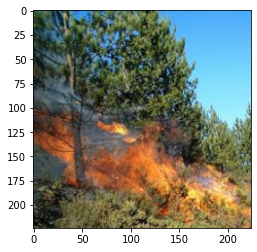

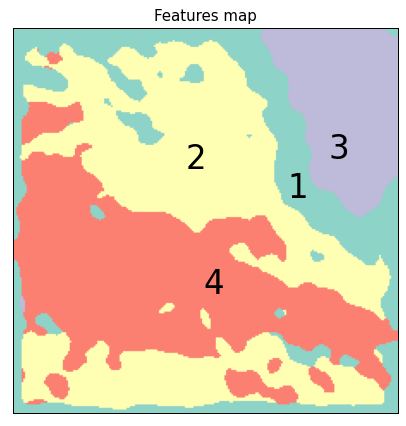

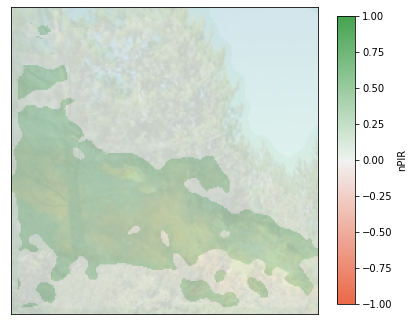

In [249]:
visualize_correlation(972,[first_fire])

> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


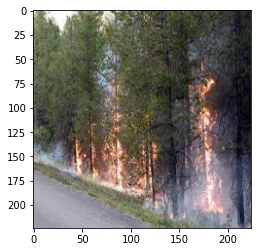

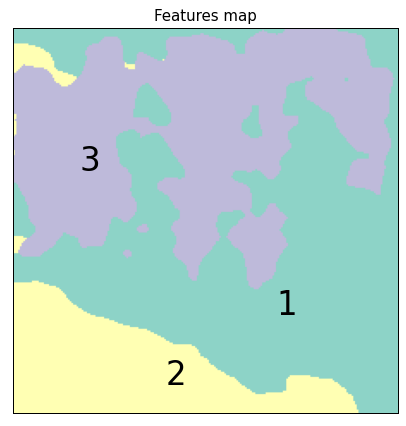

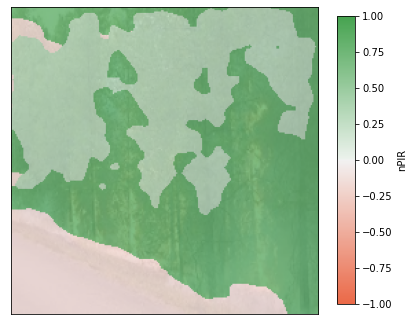

In [250]:
visualize_correlation(972,[second_fire]) 

### Test_set Analysis

In [251]:
#take fire samples from unbatched testset
test_ds=test_dataset.unbatch()
fires=[]
for el,label in test_ds:
    if int(label) == 0:
      fires.append([el,label])

Let's see whether other fire samples have "cliff"(972) in their top 5 predictions:

Number of images found: 16
> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


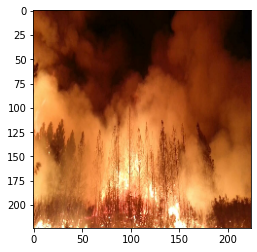

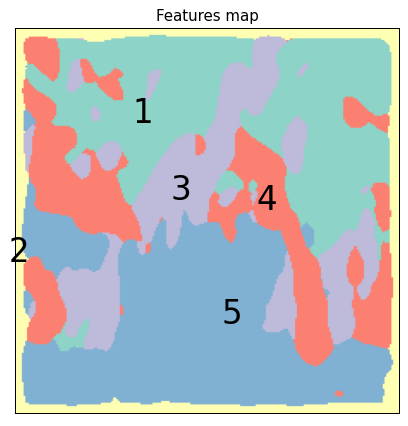

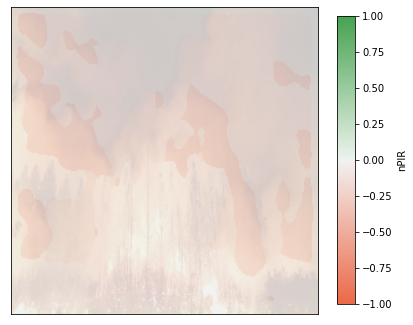

> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


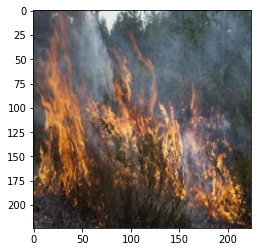

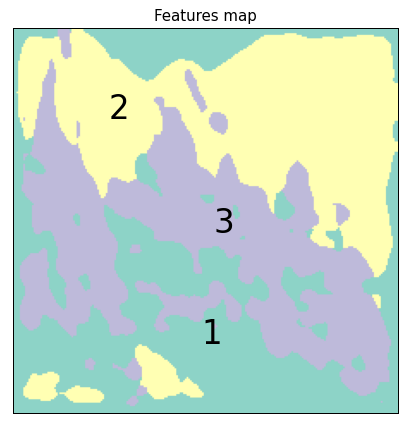

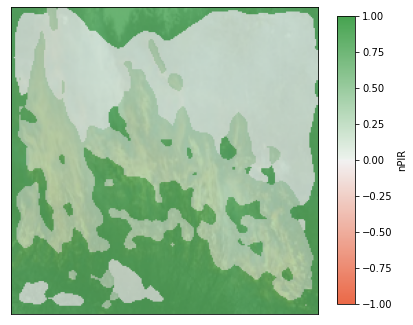

> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


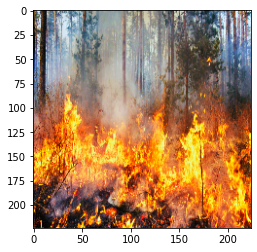

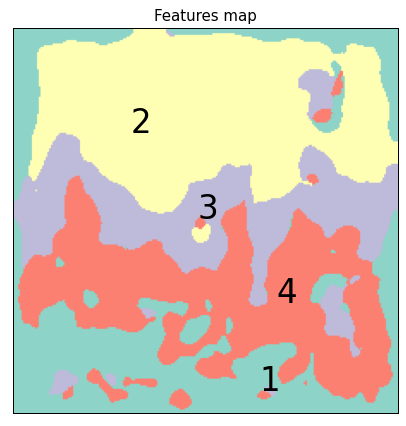

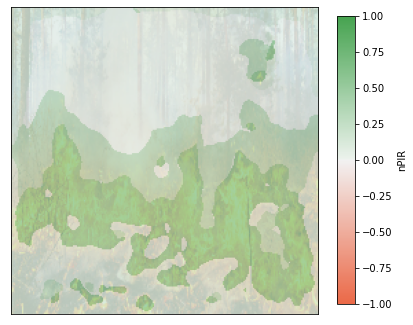

> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


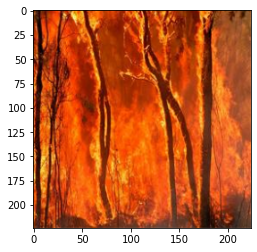

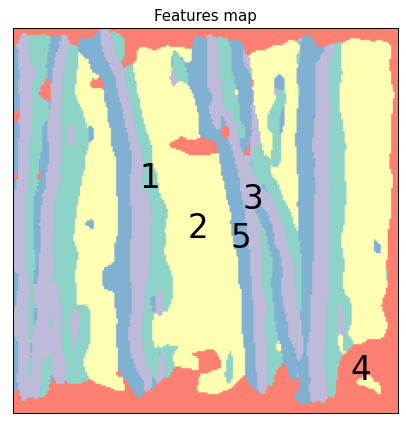

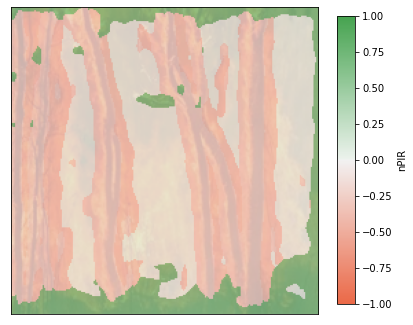

> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


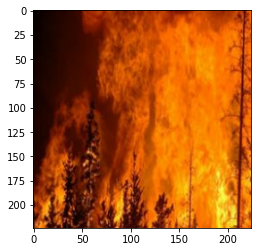

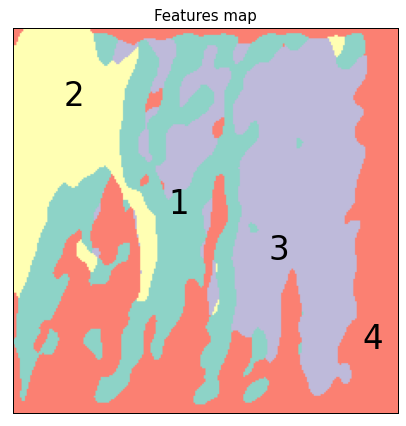

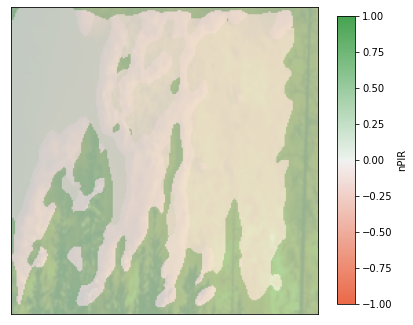

> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


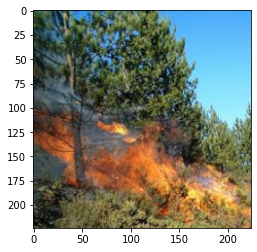

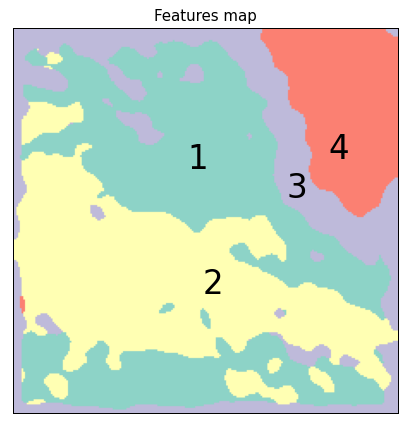

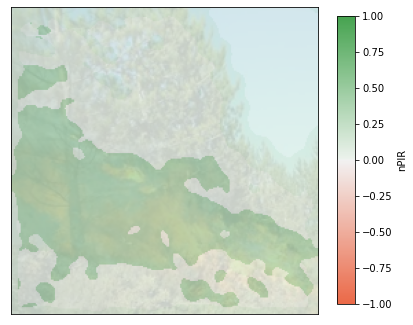

> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


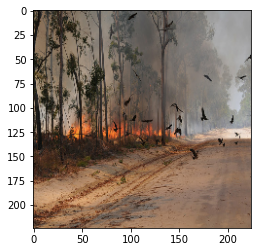

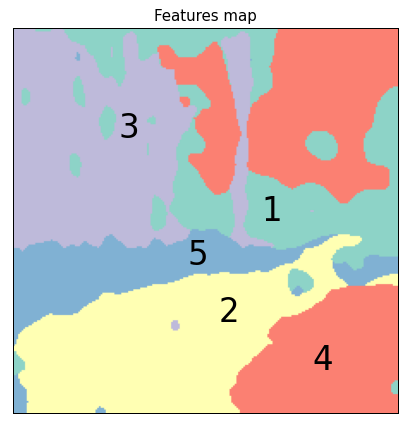

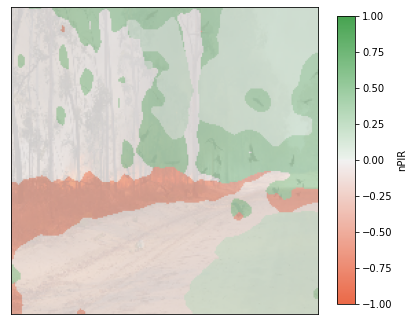

> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


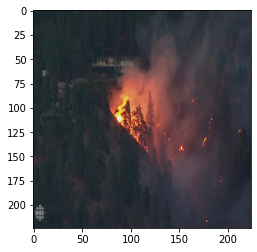

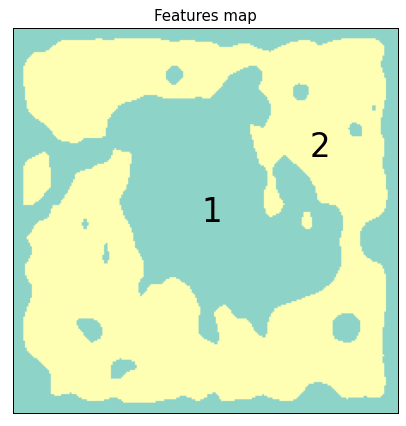

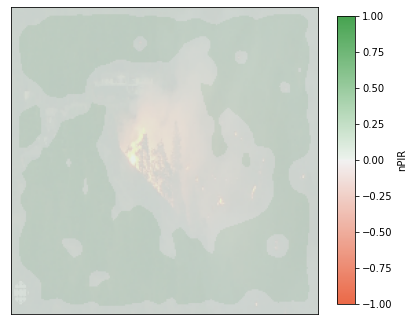

> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


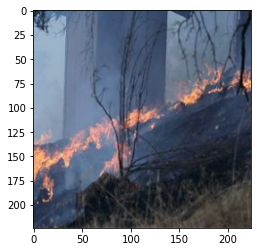

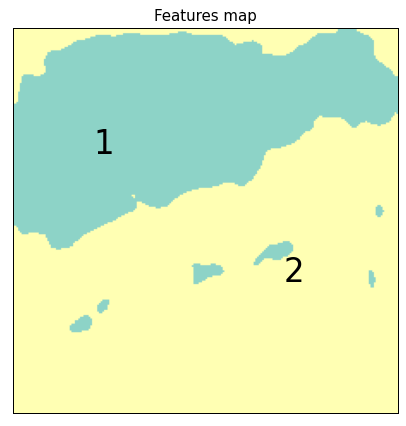

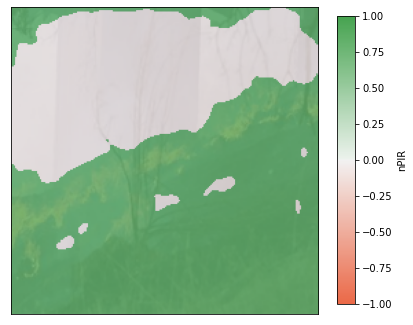

> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


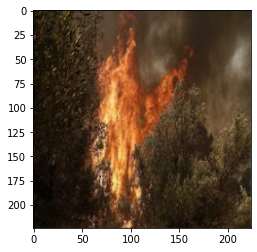

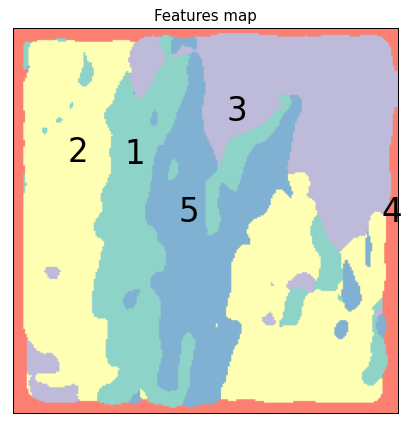

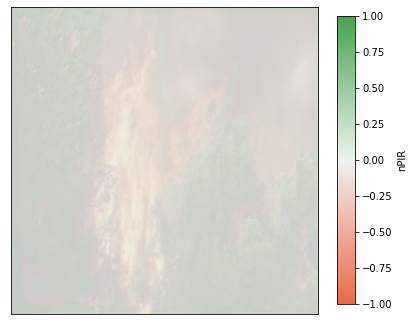

> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


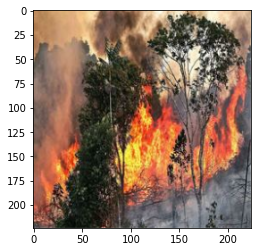

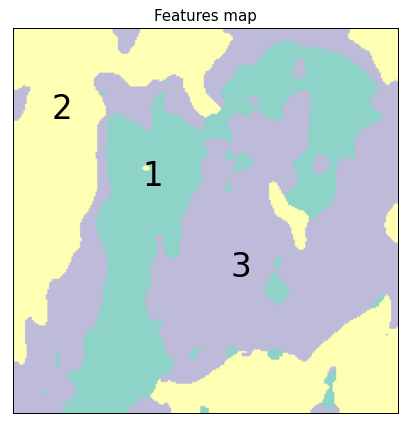

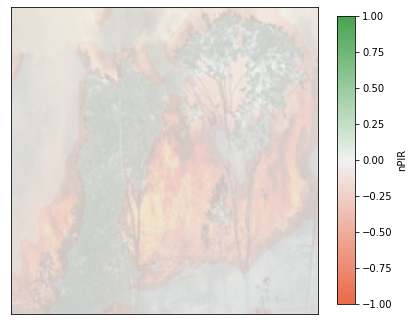

> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


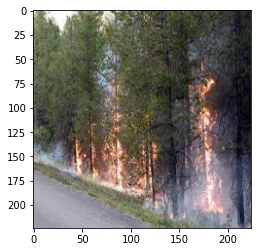

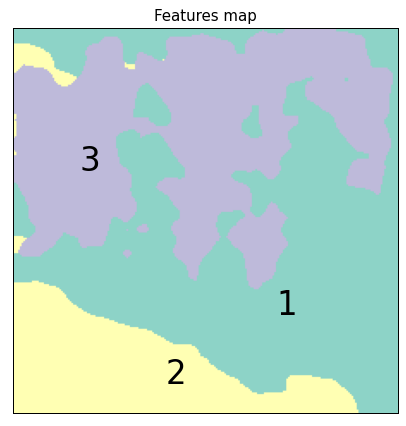

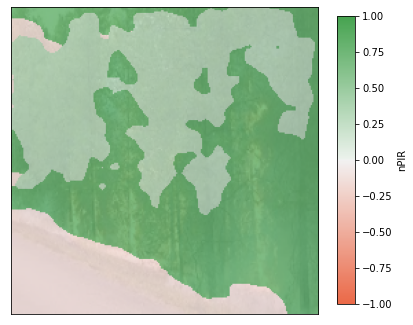

> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


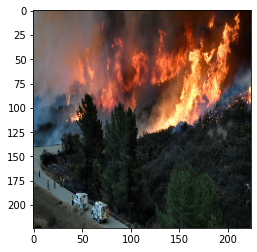

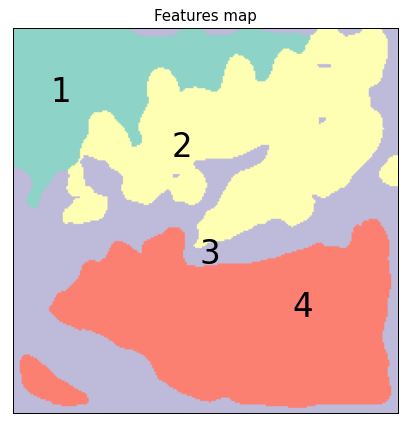

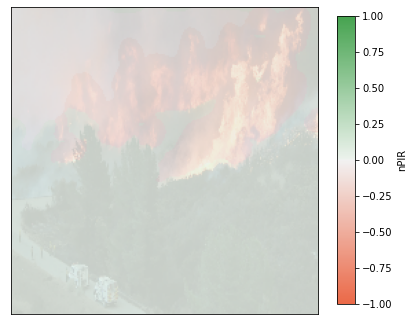

> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


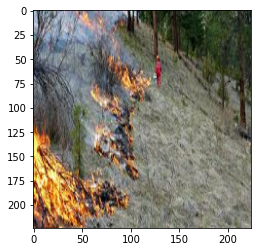

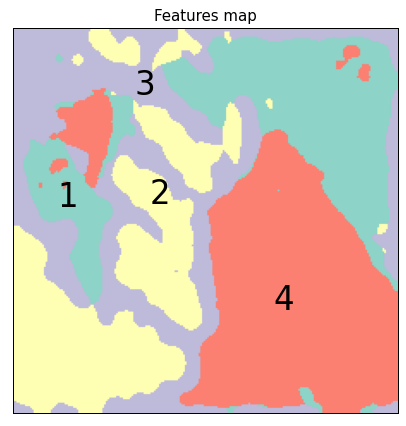

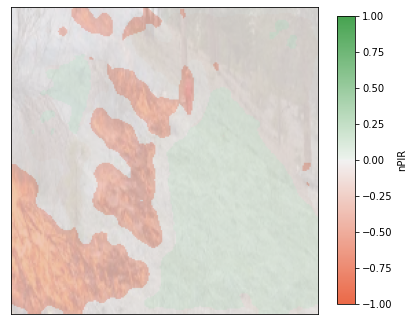

> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


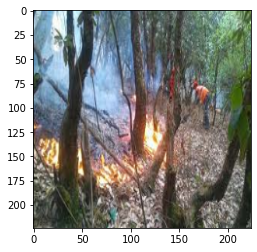

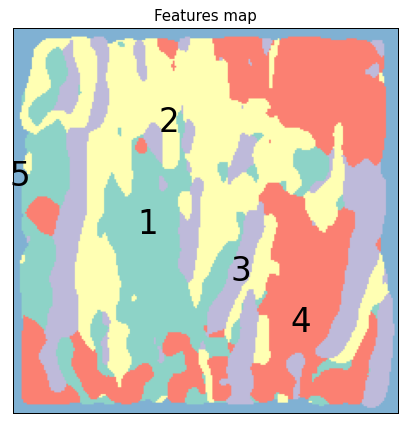

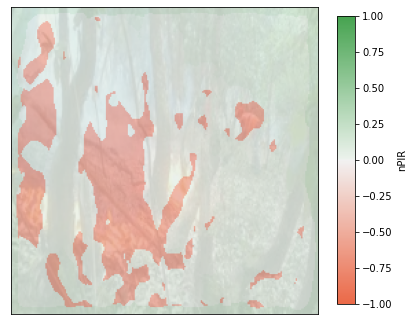

> Computing explanation with '2' features...
> Computing explanation with '3' features...
> Computing explanation with '4' features...
> Computing explanation with '5' features...


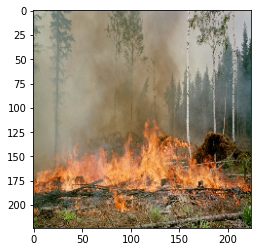

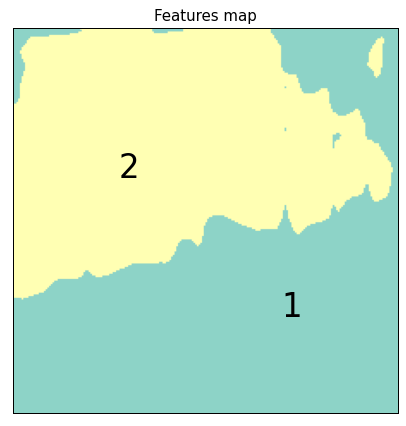

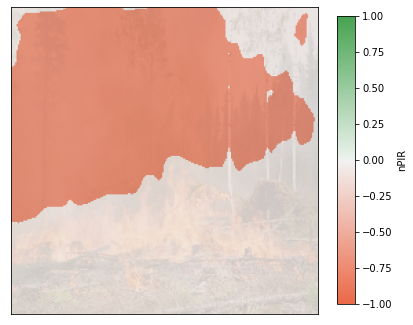

In [254]:
res = find(VGG16_model,972,5,fires)
if len(res) != 0: 
  visualize_correlation(972,res)

The remaining part of the EBAnO explanation can be found in the FFRp3.ipynb file.
In that file is present the study about the relation between the class "volcano" and the images' region with fires and the differences between the samples correctly classified and the test errors presenting the pattern "cliff/flames".